In [ ]:
!pip install transformers  timm einops flash_attn openai

In [ ]:
!nvidia-smi

Tue Jun 25 17:23:05 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Import Library

In [ ]:
from transformers import AutoProcessor, AutoModelForCausalLM

from PIL import Image

from openai import AzureOpenAI
import openai


import requests
import copy
import sys
import os
import json

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
print(f'Python version: {sys.version}')

Python version: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


# Load the model

In [ ]:
openai.api_type: str = "azure_ad"
azure_endpoint = "https://mobility-sage-openai-services.openai.azure.com/"
api_version = "2024-02-01"
api_key = "9bbf92a17be24c66881eaa5a1c6aa77d"

In [ ]:
print("Open AI version:", openai.__version__)

Open AI version: 1.35.3


In [ ]:
dalle_model = AzureOpenAI(api_version=api_version,
                     azure_endpoint=azure_endpoint,
                     api_key=api_key)

In [ ]:
model_id = 'microsoft/Florence-2-large'

model = AutoModelForCausalLM.from_pretrained(model_id,
                                             trust_remote_code=True).eval()

processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

# Helper Function

In [ ]:
def run_example(task_prompt, text_input = None):
  """
    Calling Microsoft Florence-2 model
  """
  if text_input is None:
    prompt = task_prompt
  else:
    prompt = task_prompt + text_input

  inputs = processor(text = prompt,
                     images = image,
                     return_tensors = "pt")

  print(inputs)
  print('#----------------------------#')

  generated_ids = model.generate(
      input_ids = inputs["input_ids"],
      pixel_values = inputs['pixel_values'],
      max_new_tokens = 1024,
      early_stopping = False,
      do_sample = False,
      num_beams = 3
  )

  print(generated_ids)
  print('#----------------------------#')


  generated_text = processor.batch_decode(generated_ids,
                                          skip_special_tokens=False)[0]

  print(generated_text)
  print('#----------------------------#')


  parsed_answer = processor.post_process_generation(
      generated_text,
      task = task_prompt,
      image_size = (image.width,
                    image.height)
  )

  print(parsed_answer)
  print('#----------------------------#')


  return parsed_answer



In [ ]:
def dalle_3_iamge_generation(prompt,
           image_file="dalle3.jpg",
           size="1024x1024",
           quality="standard",
           style="natural"):
    """
    Dalle 3 image
    """

    response = dalle_model.images.generate(
        model="dall-e-3",  # Name of the Dall e3 deployed model
        prompt=prompt,  # Prompt
        n=1,  # Number of images
        size=size,  # 1792x1024 or 1024x1024 or 1024x1792
        quality=quality,  # hd or standard
        style=style,  # natural or vivid
    )

    print(response)
    # image_url = response.data[0].url

    # Loading the json results
    resp = json.loads(response.model_dump_json())

    # Getting the url image (the first one)
    dalleimage = requests.get(resp["data"][0]["url"]).content

    # Saving the image as a local file
    with open(image_file, "wb") as imagefile:
        imagefile.write(dalleimage)

    return image_file

In [ ]:
def display_side_by_side(image_file1, image_file2):
    """
    Display two images side by side
    """
    # Reading images
    img1 = plt.imread(image_file1)
    img2 = plt.imread(image_file2)

    # Subplots
    f, ax = plt.subplots(1, 2, figsize=(15, 8))
    ax[0].imshow(img1)
    ax[1].imshow(img2)

    # Titles
    ax[0].set_title("Real Image")
    ax[1].set_title("Artificial Dall-E3 image")
    title = "Image to image with Florence2 and Dall-e3"
    f.suptitle(title, fontsize=15)
    plt.tight_layout()

    # Removing the axis
    ax[0].axis("off")
    ax[1].axis("off")
    plt.show()

# Pipeline




```
Load Image -> Florence 2: Generate Caption -> Dalle 3: Generate Image -> Display Result
```



### Get the detailed caption from the Florence-2 model.

In [ ]:
img_url = '/content/m1.jpg'
image = Image.open(img_url)

In [ ]:
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[-1.0562, -0.7479, -0.0629,  ..., -0.2856, -1.5870, -2.1179],
          [-1.1075, -0.5424,  0.6906,  ..., -0.0972, -1.3987, -1.9980],
          [ 0.4337,  0.3823,  0.2111,  ...,  0.1597, -1.2103, -1.8097],
          ...,
          [-1.4843, -1.4843, -1.5185,  ..., -2.0665, -2.0323, -2.0323],
          [-1.9980, -1.9980, -2.0152,  ..., -2.0665, -2.0494, -2.0494],
          [-2.1008, -2.1008, -2.1008,  ..., -2.0323, -2.0323, -2.0323]],

         [[-1.6506, -1.3354, -0.6352,  ..., -0.1800, -1.4755, -2.0357],
          [-1.7206, -1.1253,  0.1527,  ...,  0.0301, -1.3004, -1.8957],
          [-0.0924, -0.1450, -0.3200,  ...,  0.2927, -1.0903, -1.7031],
          ...,
          [-1.4055, -1.4055, -1.4405,  ..., -2.0357, -2.0182, -2.0182],
          [-1.9307, -1.9307, -1.9482,

In [ ]:
result['<DETAILED_CAPTION>']

'The image shows a woman standing in front of a wall covered in newspapers, wearing a beautiful green silk cheongsam with intricate embroidery. On the right side of the image, there is a chair and a table with various objects on it.'

### Pass the prompt to Dalle 3

In [ ]:
prompt = result['<DETAILED_CAPTION>']

dalle_3_image_file = dalle_3_iamge_generation(prompt, size="1024x1024", quality="hd", style="natural")

### Display image side by side.

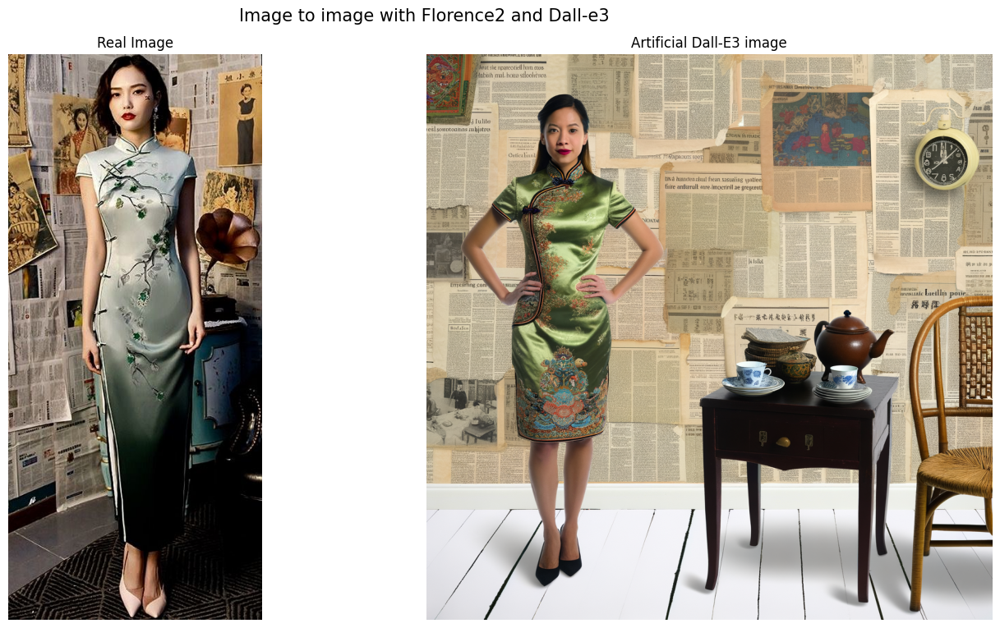

In [ ]:
display_side_by_side(img_url, dalle_3_image_file)

### Entire Pipeline at once.

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 0.7591,  0.7591,  0.7591,  ..., -1.2959, -1.2617, -1.2445],
          [ 0.7591,  0.7591,  0.7591,  ..., -1.3130, -1.2788, -1.2617],
          [ 0.7591,  0.7591,  0.7591,  ..., -1.3302, -1.2959, -1.2788],
          ...,
          [-0.4397, -0.5082, -0.6623,  ...,  1.0331,  1.0502,  1.0502],
          [-0.3369, -0.4054, -0.5767,  ...,  1.0844,  1.1015,  1.1015],
          [-0.2684, -0.3369, -0.5082,  ...,  1.1187,  1.1358,  1.1358]],

         [[ 0.7304,  0.7304,  0.7479,  ..., -1.1253, -1.0903, -1.0728],
          [ 0.7304,  0.7304,  0.7479,  ..., -1.1429, -1.1078, -1.0903],
          [ 0.7304,  0.7304,  0.7479,  ..., -1.1604, -1.1253, -1.1078],
          ...,
          [-0.3200, -0.3901, -0.5476,  ...,  0.9580,  0.9755,  0.9755],
          [-0.2150, -0.2850, -0.4601,

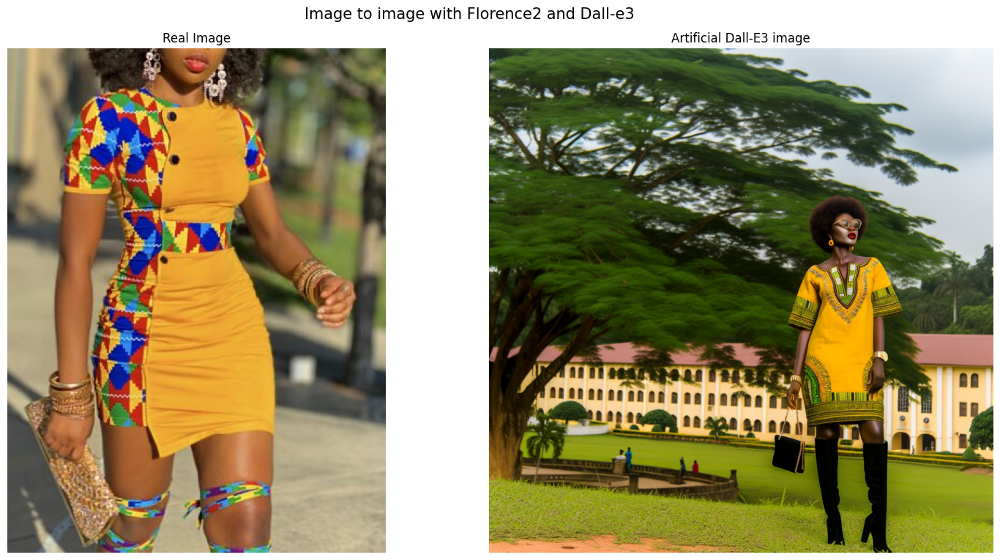

In [ ]:
img_url = '/content/m2.jpeg'
image = Image.open(img_url)

# Generate Captions
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)
prompt = result['<DETAILED_CAPTION>']


# Generate Image
dalle_3_image_file = dalle_3_iamge_generation(prompt, size="1024x1024", quality="hd", style="natural")

# Display Image
display_side_by_side(img_url, dalle_3_image_file)

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[-0.5253, -0.5253, -0.5253,  ..., -2.1008, -2.1008, -2.1008],
          [-0.5253, -0.5253, -0.5253,  ..., -2.1008, -2.1008, -2.1008],
          [-0.5253, -0.5253, -0.5253,  ..., -2.1008, -2.1008, -2.1008],
          ...,
          [-1.5699, -1.5699, -1.5699,  ..., -1.4329, -1.4329, -1.4329],
          [-1.6384, -1.6384, -1.6384,  ..., -1.5357, -1.5357, -1.5357],
          [-1.8097, -1.8097, -1.8097,  ..., -1.5870, -1.5870, -1.5870]],

         [[-0.3550, -0.3550, -0.3550,  ..., -1.9657, -1.9657, -1.9657],
          [-0.3550, -0.3550, -0.3550,  ..., -1.9657, -1.9657, -1.9657],
          [-0.3550, -0.3550, -0.3550,  ..., -1.9657, -1.9657, -1.9657],
          ...,
          [-1.6506, -1.6506, -1.6506,  ..., -1.4755, -1.4755, -1.4755],
          [-1.7206, -1.7206, -1.7206,

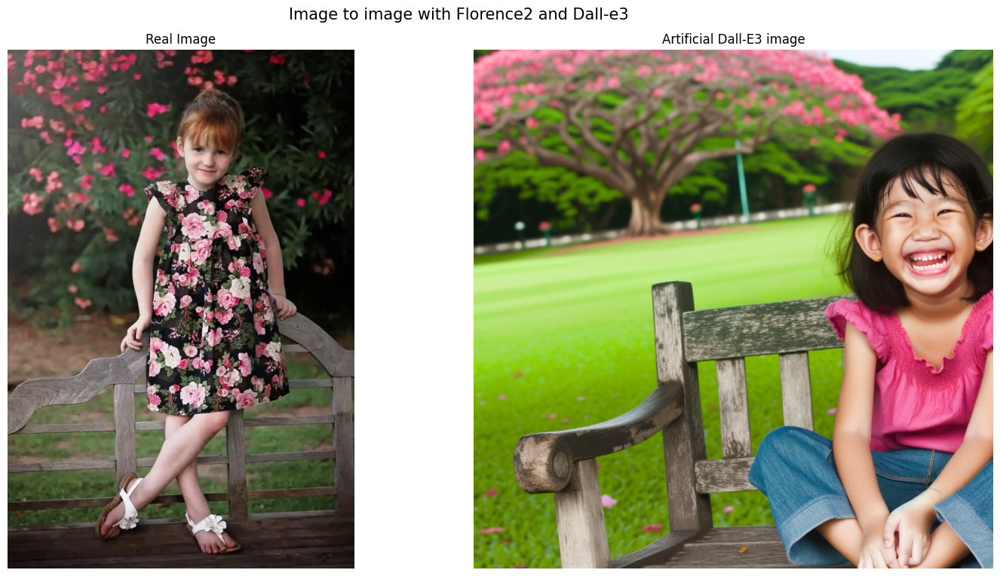

In [ ]:
img_url = '/content/m3.webp'
image = Image.open(img_url)

# Generate Captions
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)
prompt = result['<DETAILED_CAPTION>']


# Generate Image
dalle_3_image_file = dalle_3_iamge_generation(prompt, size="1024x1024", quality="hd", style="natural")

# Display Image
display_side_by_side(img_url, dalle_3_image_file)

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[-1.3987, -1.3987, -1.3987,  ..., -1.6213, -1.6555, -1.6555],
          [-1.3987, -1.3987, -1.3987,  ..., -1.6213, -1.6555, -1.6555],
          [-1.3987, -1.3987, -1.3987,  ..., -1.6213, -1.6555, -1.6555],
          ...,
          [-1.9467, -1.9467, -1.9467,  ..., -1.7240, -1.7583, -1.7583],
          [-1.9467, -1.9467, -1.9295,  ..., -1.7240, -1.7583, -1.7583],
          [-1.9467, -1.9467, -1.9124,  ..., -1.7240, -1.7583, -1.7583]],

         [[-1.3704, -1.3704, -1.3704,  ..., -1.5105, -1.5455, -1.5455],
          [-1.3704, -1.3704, -1.3704,  ..., -1.5105, -1.5455, -1.5455],
          [-1.3704, -1.3704, -1.3704,  ..., -1.5105, -1.5455, -1.5455],
          ...,
          [-1.8606, -1.8606, -1.8606,  ..., -1.6155, -1.6506, -1.6506],
          [-1.8606, -1.8606, -1.8431,

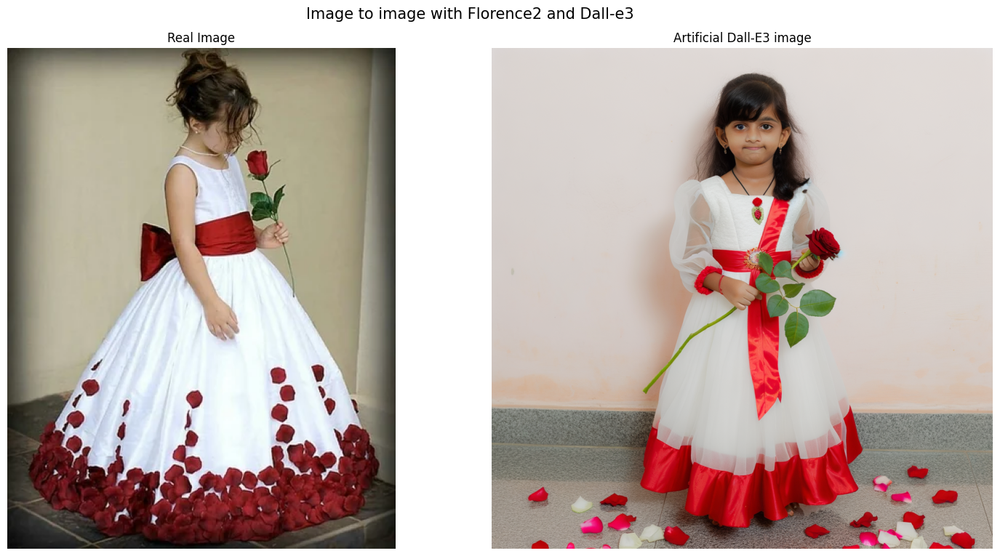

In [ ]:
img_url = '/content/m4.webp'
image = Image.open(img_url)

# Generate Captions
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)
prompt = result['<DETAILED_CAPTION>']


# Generate Image
dalle_3_image_file = dalle_3_iamge_generation(prompt, size="1024x1024", quality="hd", style="natural")

# Display Image
display_side_by_side(img_url, dalle_3_image_file)

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[1.5297, 1.5297, 1.5297,  ..., 1.4612, 1.4612, 1.4612],
          [1.5297, 1.5297, 1.5297,  ..., 1.4612, 1.4612, 1.4612],
          [1.5297, 1.5297, 1.5297,  ..., 1.4612, 1.4612, 1.4612],
          ...,
          [1.4783, 1.4783, 1.4783,  ..., 1.4612, 1.4612, 1.4612],
          [1.4783, 1.4783, 1.4783,  ..., 1.4612, 1.4612, 1.4612],
          [1.4783, 1.4783, 1.4783,  ..., 1.4612, 1.4612, 1.4612]],

         [[1.6758, 1.6758, 1.6758,  ..., 1.6408, 1.6408, 1.6408],
          [1.6758, 1.6758, 1.6758,  ..., 1.6408, 1.6408, 1.6408],
          [1.6758, 1.6758, 1.6758,  ..., 1.6408, 1.6408, 1.6408],
          ...,
          [1.6583, 1.6583, 1.6583,  ..., 1.6408, 1.6408, 1.6408],
          [1.6583, 1.6583, 1.6583,  ..., 1.6408, 1.6408, 1.6408],
          [1.6583, 1.6583, 1.65

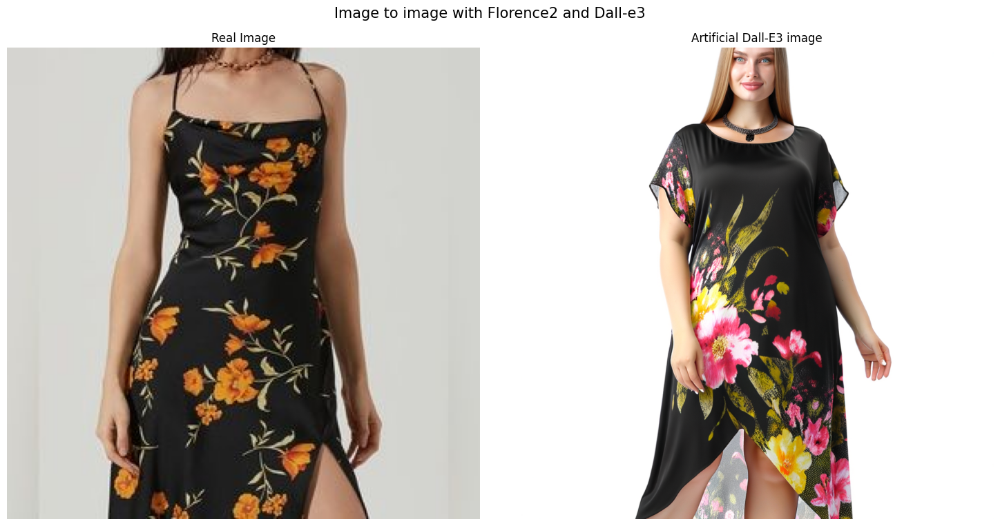

In [ ]:
img_url = '/content/m5.jpg'
image = Image.open(img_url)

# Generate Captions
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)
prompt = result['<DETAILED_CAPTION>']


# Generate Image
dalle_3_image_file = dalle_3_iamge_generation(prompt, size="1024x1024", quality="hd", style="natural")

# Display Image
display_side_by_side(img_url, dalle_3_image_file)

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[-1.2445, -1.2103, -1.2788,  ..., -2.0494, -2.0494, -2.0494],
          [-1.2617, -1.2959, -1.3815,  ..., -2.0494, -2.0494, -2.0494],
          [-1.3302, -1.4158, -1.5185,  ..., -2.0494, -2.0494, -2.0494],
          ...,
          [-1.4672, -1.4672, -1.4843,  ..., -2.0494, -2.0494, -2.0494],
          [-1.3815, -1.4500, -1.5528,  ..., -2.0494, -2.0494, -2.0494],
          [-1.2788, -1.3987, -1.5357,  ..., -2.0494, -2.0494, -2.0494]],

         [[-1.5630, -1.5280, -1.5980,  ..., -1.9832, -1.9832, -1.9832],
          [-1.5805, -1.6155, -1.7031,  ..., -1.9832, -1.9832, -1.9832],
          [-1.6506, -1.7206, -1.8431,  ..., -1.9657, -1.9657, -1.9657],
          ...,
          [-1.4755, -1.4755, -1.4930,  ..., -1.9657, -1.9657, -1.9657],
          [-1.3880, -1.4580, -1.5630,

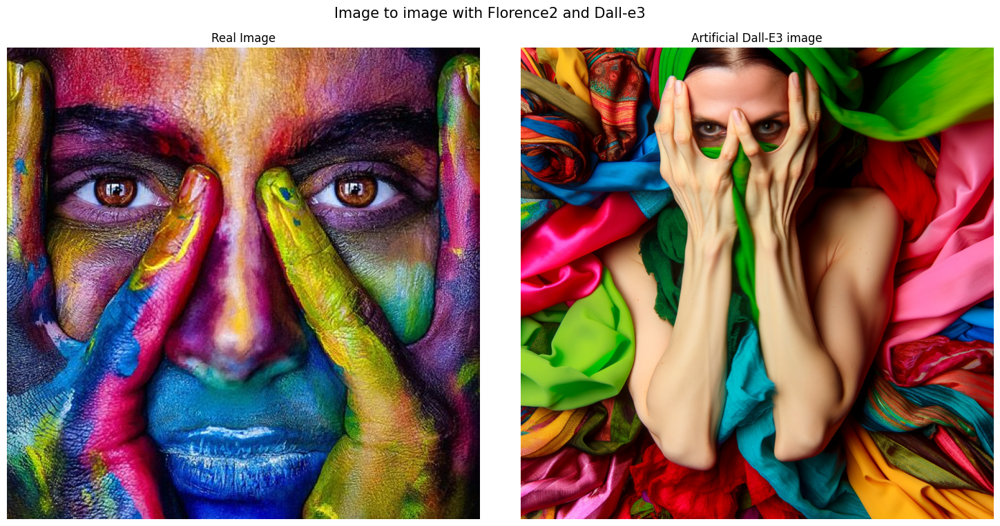

In [ ]:
img_url = '/content/m6.jpeg'
image = Image.open(img_url)

# Generate Captions
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)
prompt = result['<DETAILED_CAPTION>']


# Generate Image
dalle_3_image_file = dalle_3_iamge_generation(prompt, size="1024x1024", quality="hd", style="natural")

# Display Image
display_side_by_side(img_url, dalle_3_image_file)

{'input_ids': tensor([[    0, 47066, 21700,    11,  4617,    99,    16,  2343,    11,     5,
          2274,     4,     2]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]), 'pixel_values': tensor([[[[ 1.7180,  1.9064,  1.8893,  ..., -1.2445, -1.4158, -1.2103],
          [ 1.7352,  1.9064,  1.9235,  ..., -1.2103, -1.3644, -1.2103],
          [ 1.7694,  1.9064,  1.9064,  ..., -1.2274, -1.3815, -1.2274],
          ...,
          [ 0.8276,  1.1015,  0.9817,  ...,  0.9988,  0.9988,  0.9817],
          [ 0.9646,  1.0844,  1.1187,  ...,  1.0502,  0.9817,  0.9817],
          [ 0.8618,  0.9474,  1.1015,  ...,  1.1529,  1.1015,  1.0331]],

         [[ 1.9034,  2.0959,  2.0784,  ..., -1.0553, -1.2304, -1.0203],
          [ 1.9209,  2.0959,  2.1134,  ..., -1.0203, -1.1779, -1.0203],
          [ 1.9559,  2.0959,  2.0959,  ..., -1.0378, -1.1954, -1.0378],
          ...,
          [ 0.8354,  1.1155,  1.0105,  ...,  0.9405,  0.9580,  0.9230],
          [ 0.9755,  1.0980,  1.1331,

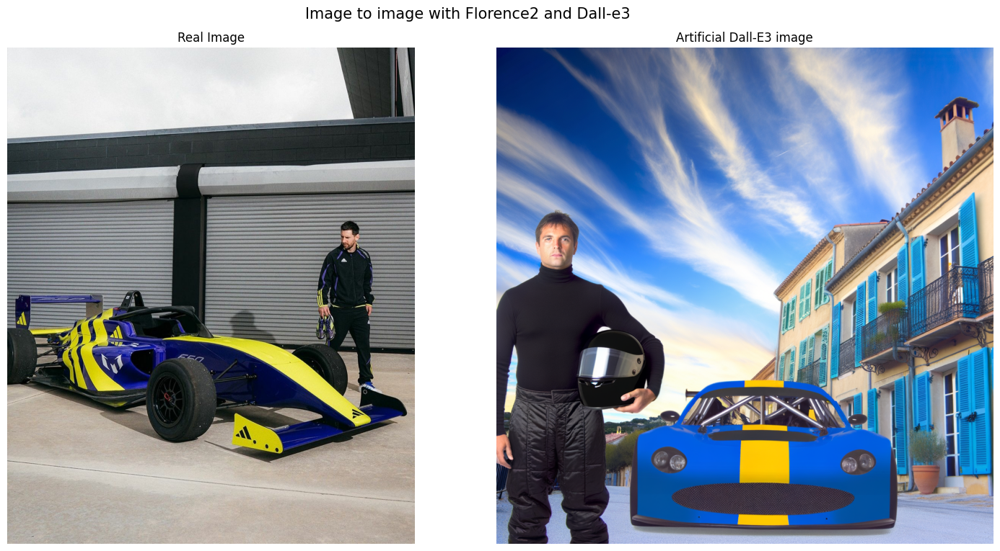

In [45]:
img_url = '/content/test_1.jpeg'
image = Image.open(img_url)

# Generate Captions
task_prompt = '<DETAILED_CAPTION>'
result = run_example(task_prompt)
prompt = result['<DETAILED_CAPTION>']


# Generate Image
dalle_3_image_file = dalle_3_iamge_generation(prompt, size="1024x1024", quality="hd", style="natural")

# Display Image
display_side_by_side(img_url, dalle_3_image_file)